# Case Study - Product Demands Prediction 
- Analyze the data (sent as an attachment to the email):

Product Article Attributes (master data)

Historical unit sales (article level)

Historical Product popularity

- Evaluate how we can use some of the above data to estimate demand for “NEW” products

Feel free to mockup & recommend some of your own data sources based on your experience

- What would be a good MVP (Minimum Viable Product):

Think of an appropriate sub-problem to focus on

How can you control the complexity of the problem


- How would you conceptualize the problem in terms of:

Data Cleansing, Feature selection

Modeling, Relevant outcome variables

Extensibility, Tuning & Potential pitfalls of the model & design approach


### Table of Content
1. Import packages & Read files
2. Data Preprocessing
    - Duplicates, Missing values, Sanity Check, Joins
- Exploratory Analysis

## 1. Import packages & Read data

In [1]:
#pip install category_encoders
#pip install -U kaleido
#pip install feature_engine

In [1]:
import pandas as pd
import numpy as np
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.express as px
import plotly.figure_factory as ff
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import f_oneway
import scipy.stats as stats
import statsmodels.api as sm
from statsmodels.formula.api import ols
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler,MinMaxScaler
from feature_engine.encoding import CountFrequencyEncoder
import category_encoders as ce
from sklearn import metrics

#### Load data sets:
- Product Article Attributes (master data)
- Historical unit sales (article level)
- Historical Product popularity

In [2]:
dt= pd.read_csv("data/product articles attributes.csv")
hist_sales= pd.read_csv("data/historical unit sales.csv")
pop= pd.read_csv("data/historical product popularity.csv")

In [4]:
dt.sample(5)

,Article,MATERIAL_CONTENT_CODE,PRODUCT_TYPES,BUSINESS_SEGMENTS,NRF_COLOR_CODE,MODEL,Sustainablity,MARKETING_CATEGORY
13412,X13414,AT2G,1.0,3030975.0,33.0,EBE29,PFC free,EB1
36712,B36714,TRK8,16.0,9759758.0,600.0,LAI09,Primeblue nylon,LA5
14525,S14527,AT2E,1.0,9752975.0,36.0,21625,Primeblue nylon,2118
50182,D50184,TRFS,39.0,3097.0,1.0,FCH03,Organic materials,FC1
25248,D25250,TRK4,24.0,8342.0,1.0,JQ428,Organic materials,JQ18


In [3]:
hist_sales.head()

,Article,Units_sold
0,J10,12
1,U21,12
2,E31,12
3,P42,12
4,C55,12


In [4]:
pop.head()

,Article,Searches,Social_References
0,A1,193,97
1,B2,70,53
2,C3,211,53
3,D4,45,23
4,E5,183,137


## 2. Data Preprocessing
### 2-1. Duplicates
1. Check if there is any duplicate articale ID in the master table, as this will be the column to join on with other 2 tables



In [7]:
dt[dt.duplicated(['Article'])]

,Article,MATERIAL_CONTENT_CODE,PRODUCT_TYPES,BUSINESS_SEGMENTS,NRF_COLOR_CODE,MODEL,Sustainablity,MARKETING_CATEGORY


2. Find duplicate rows that have the same values across all columns in all three tables

In [8]:
print(dt.duplicated().sum())
print(hist_sales.duplicated().sum())
print(pop.duplicated().sum())

0
0
0


### 2-2. Missing Values
We don't have missing values in the units_sold nor the article ID. However, we have some null value in the categorical columns. This will be dealt with later in the feature engineering part.

In [41]:
dt.isnull().sum()

Article                   0
MATERIAL_CONTENT_CODE     6
PRODUCT_TYPES             4
BUSINESS_SEGMENTS         4
NRF_COLOR_CODE           25
MODEL                     1
Sustainablity             0
MARKETING_CATEGORY        0
dtype: int64

In [42]:
hist_sales.isnull().sum()

Article       0
Units_sold    0
dtype: int64

In [43]:
pop.isnull().sum()

Article              0
Searches             0
Social_References    0
dtype: int64

### 2-3. Other Sanity Check
Unit_sold, searches and social_references should not contain negative integers. (There is no such occurence). Distribution of the metrics will be inspected later in the exploratory analysis part.

In [9]:
# Unit sales should not be a negative number
hist_sales[(hist_sales['Units_sold'] < 0)]
pop[(pop['Searches'] < 0)]
pop[(pop['Social_References'] < 0)]

,Article,Searches,Social_References


### 2-4. Join all 3 tables

In [316]:
df1 = pd.merge(dt, pop, how="left", on=["Article"])
df = pd.merge(df1, hist_sales, how="left", on=["Article"])

In [7]:
df.head()

,Article,MATERIAL_CONTENT_CODE,PRODUCT_TYPES,BUSINESS_SEGMENTS,NRF_COLOR_CODE,MODEL,Sustainablity,MARKETING_CATEGORY,Searches,Social_References,Units_sold
0,A1,TRFU,44.0,97528.0,1.0,GKD49,Organic materials,GK6,193,97,84
1,B2,AT2E,1.0,3030975.0,1.0,21972,Organic materials,2115,70,53,36
2,C3,TREU,39.0,303034.0,997.0,KYH28,Low carbon footprint,KY25,211,53,120
3,D4,TRK4,51.0,30305.0,400.0,GUP97,Reegrow,GU16,45,23,24
4,E5,TRK4,19.0,886.0,1.0,DBI07,Recycleable,DB7,183,137,96


## 3. Exploratory Analysis

#### Categorical Features: Box plot + Count Plot
#### Numerical Features: Distributions, Correlation heatmap

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 60671 entries, 0 to 60670
Data columns (total 11 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Article                60671 non-null  object 
 1   MATERIAL_CONTENT_CODE  60665 non-null  object 
 2   PRODUCT_TYPES          60667 non-null  float64
 3   BUSINESS_SEGMENTS      60667 non-null  float64
 4   NRF_COLOR_CODE         60646 non-null  float64
 5   MODEL                  60670 non-null  object 
 6   Sustainablity          60671 non-null  object 
 7   MARKETING_CATEGORY     60671 non-null  object 
 8   Searches               60671 non-null  int64  
 9   Social_References      60671 non-null  int64  
 10  Units_sold             60671 non-null  int64  
dtypes: float64(3), int64(3), object(5)
memory usage: 5.6+ MB


### 3-1. Define Categorical & Numerical Features


In [9]:
cat_cols = ['MATERIAL_CONTENT_CODE', 'PRODUCT_TYPES', 'NRF_COLOR_CODE',
            'BUSINESS_SEGMENTS','MODEL','Sustainablity','MARKETING_CATEGORY']
num_cols = ['Searches', 'Social_References']

### 3-2. Categorical Features

##### Check how many **unique values** are in each categorical columns

In [10]:
df[cat_cols].nunique() 

MATERIAL_CONTENT_CODE      435
PRODUCT_TYPES              153
NRF_COLOR_CODE             257
BUSINESS_SEGMENTS           85
MODEL                    14098
Sustainablity               10
MARKETING_CATEGORY        5475
dtype: int64

Observation:
number of distinct categories in the features are large (high cardinality) except for *Sustainability*. This can easily increase the size of the data frame, causing problems including model training.

#### Box plot and count plot

Plot the n top categories in a given dimension by the amount of articles (count). This is to simplify the visualisation and to understand unit_sold for only the top ones for now

In [11]:
dfplot = df.copy()
# Convert the integer columns to string for plotting
dfplot[cat_cols] = dfplot[cat_cols].astype(str)

In [12]:
def top_list(df, dimension, n):
    top_list = list(df.groupby([dimension])['Article'].count().nlargest(n).index)
    return top_list

In [30]:
def top_sales(df, dimension, n):
    top_list = list(df.groupby([dimension])['Units_sold'].sum().nlargest(n).index)
    return top_list

In [31]:
n = 10
top_material = top_list(df= dfplot, dimension = 'MATERIAL_CONTENT_CODE', n = n)
top_material_sales = top_sales(df= dfplot, dimension = 'MATERIAL_CONTENT_CODE', n = n)
print("Most sold materials: ",top_material_sales)

Most sold materials:  ['AT2E', 'TRK4', 'DO07', 'M3X', 'AT2X', 'TRK7', 'AT2O', 'AT2Q', 'DO01', 'AT2F']


### Boxplot
Function for plotting the boxplot for all categorical features in the dataframe

In [35]:
def make_boxplot_top_category(df, list_of_column, n= 10):  
    fig = make_subplots(
        rows=4, cols=2, subplot_titles=list_of_column, vertical_spacing=0.1, shared_yaxes = True
    )
    for i, c in zip (range(len(list_of_column)), list_of_column):
        #toplist = top_list(df= df, dimension = c, n = n)
        toplist = top_sales(df= df, dimension = c, n = n)
        subset = df[df[c].isin(toplist)]
        fig.add_trace(go.Box(x=subset[c], y=subset["Units_sold"]),row=(i//2)+1, col=(i%2)+1, 
                  secondary_y=False)
    fig.update_layout(height=1000, width=800, template = "plotly_white", title = "Boxplot - Most sold categories",
                      yaxis_title="Unit sold",font=dict(family="Avenir")).update_traces(showlegend=False)
    fig.update_yaxes(showgrid=False)  
    fig.update_xaxes(tickfont=dict( size=8))
    
    return fig

In [36]:
make_boxplot_top_category(dfplot, cat_cols)

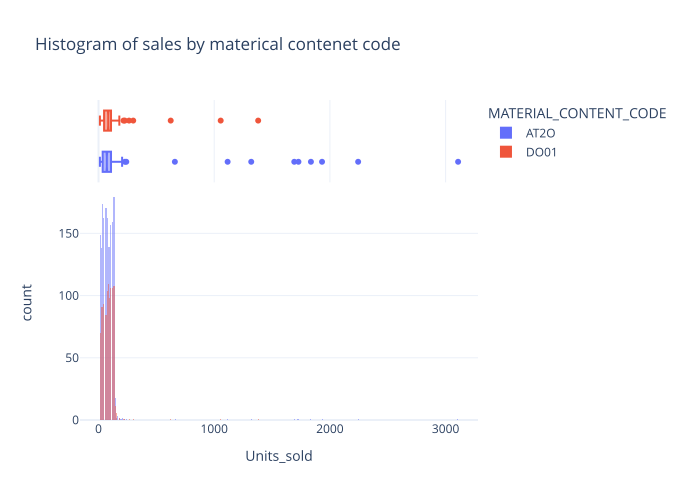

In [19]:
test = dfplot[dfplot['MATERIAL_CONTENT_CODE'].isin(["AT2O", 'DO01'])]
fig = px.histogram(test, x="Units_sold", color="MATERIAL_CONTENT_CODE", marginal="box",barmode="overlay",
                  template = "plotly_white", title= "Histogram of sales by materical contenet code")
fig.show(renderer="svg")

In [125]:
test2 = dfplot[dfplot['MODEL'].isin(["DVF21", 'JAH03'])]

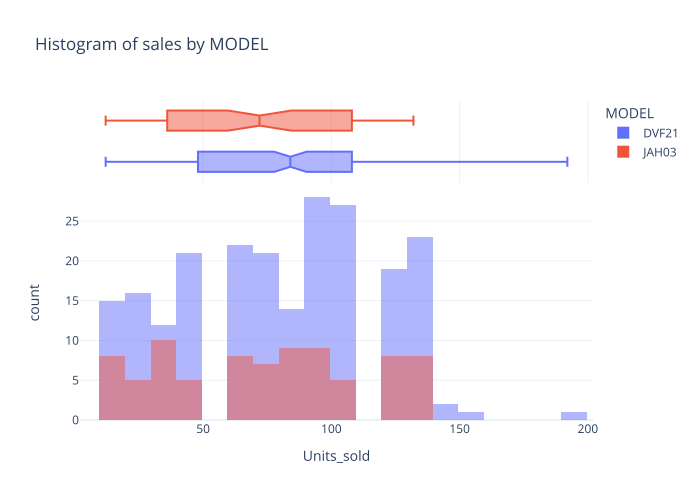

In [126]:
fig = px.histogram(test2, x="Units_sold", color="MODEL", marginal="box",barmode="overlay",
                  template = "plotly_white", title= "Histogram of sales by MODEL",
                  )
#fig.show()
fig.show(renderer="svg")

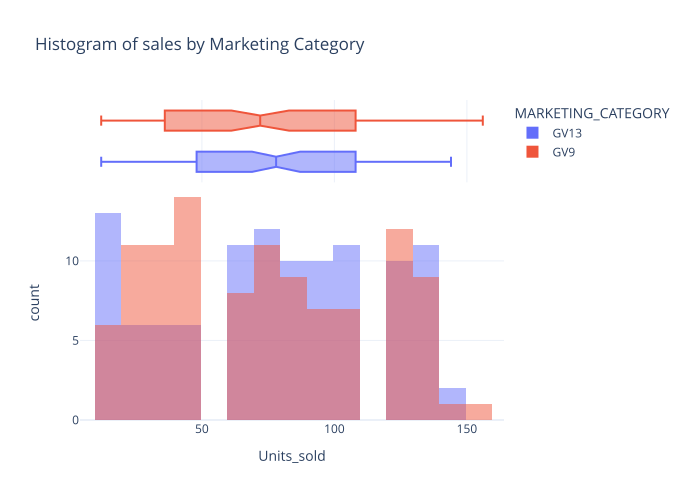

In [20]:
test3 = dfplot[dfplot['MARKETING_CATEGORY'].isin(["GV13", 'GV9'])]
fig = px.histogram(test3, x="Units_sold", color="MARKETING_CATEGORY", marginal="box",barmode="overlay",
                  template = "plotly_white", title= "Histogram of sales by Marketing Category",
                  )
#fig.show()
fig.show(renderer="svg")

#### Count Plot
Observation: Most of the categorical columns are skewed (long tailed), while "sustainability" seems to be almost uniformly distributed

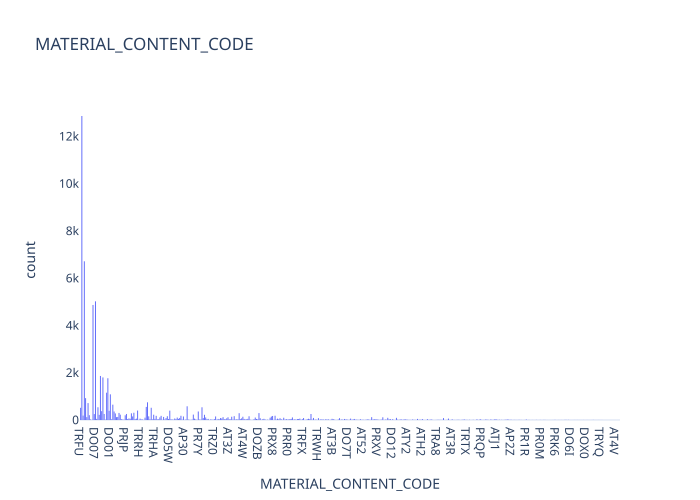

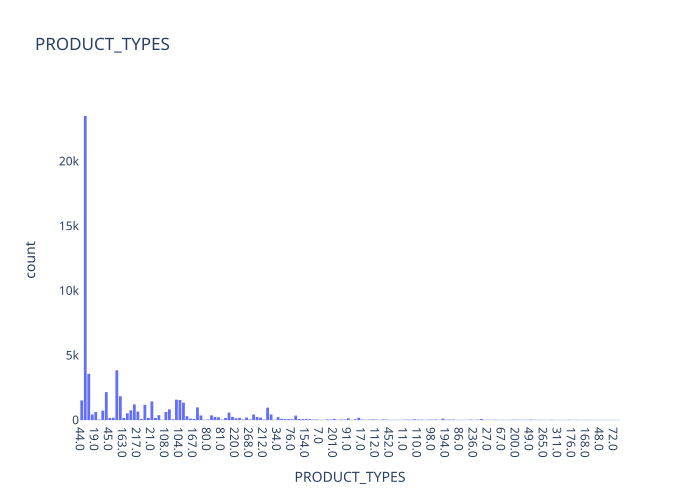

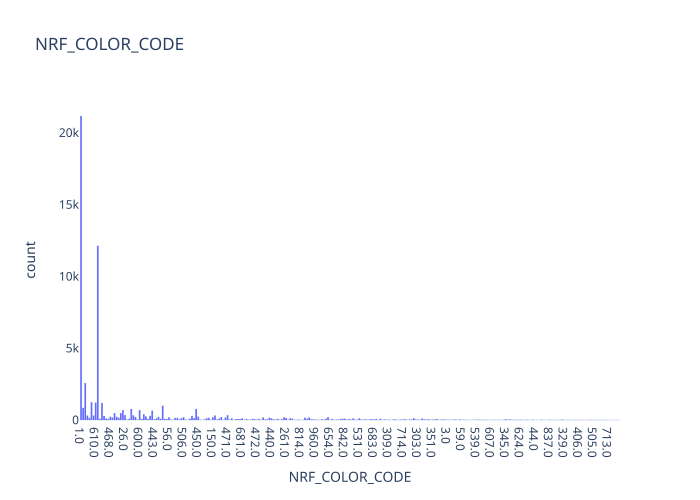

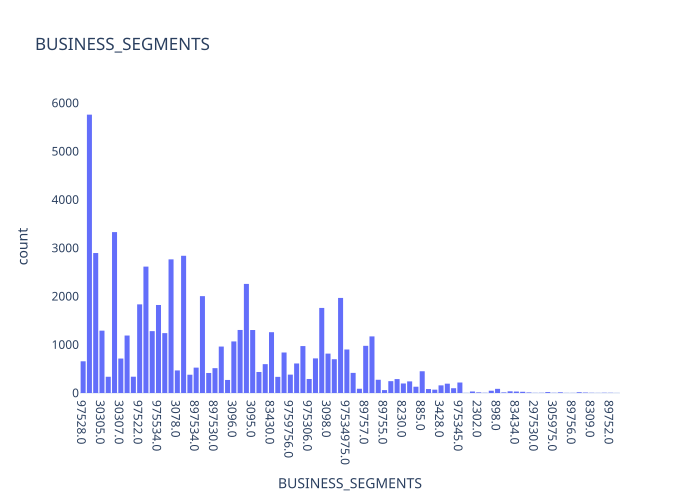

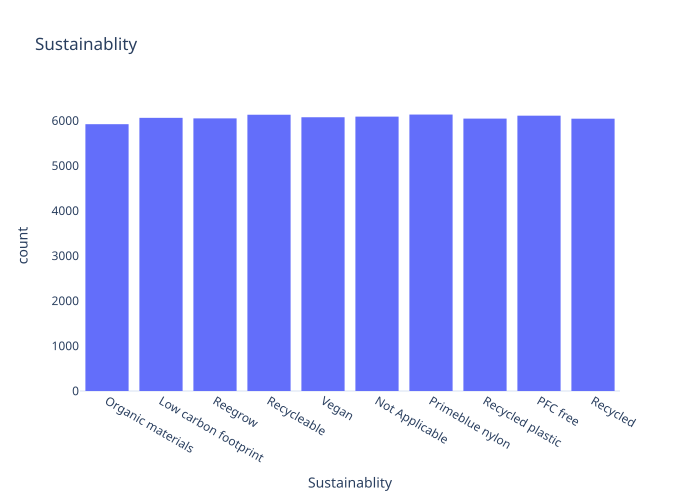

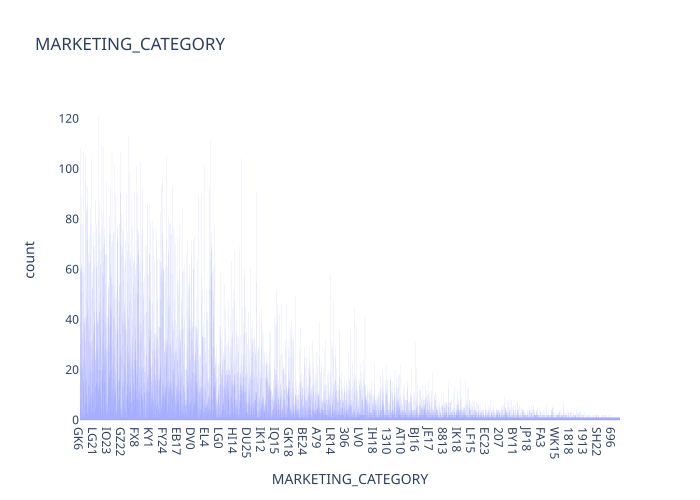

In [128]:
for c in cat_cols:
    fig = px.histogram(dfplot, x=c, title="Histogram ")
    fig.update_layout(template = "plotly_white",font=dict(family="Avenir"),
                 xaxis_title=c, title = c).update_traces(showlegend=False)
    fig.update_yaxes(showgrid=False)
    fig.show(renderer="svg")

## 3-3. Numerical Features

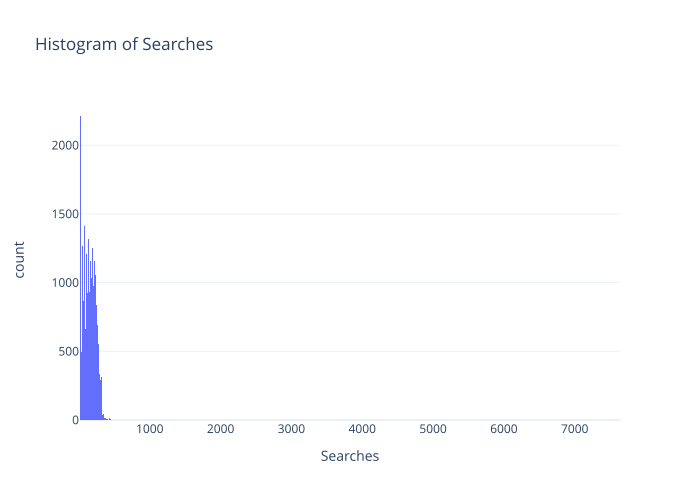

In [144]:
fig = px.histogram(dfplot, x="Searches",
                  template = "plotly_white", title= "Histogram of Searches")
#fig.show()
fig.show(renderer="svg")

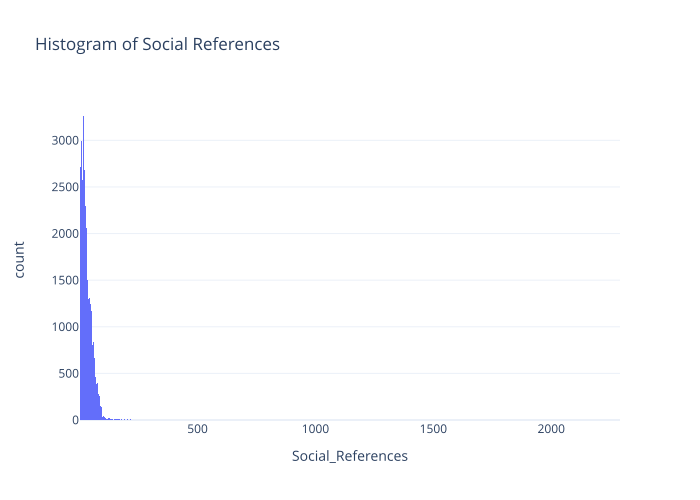

In [146]:
fig = px.histogram(dfplot, x="Social_References",
                  template = "plotly_white", title= "Histogram of Social References")
#fig.show()
fig.show(renderer="svg")

### 3-3. Numerical Features: Correlation Matrix

With numerical column input I'm using Pearson correlation to understand which metrics are related with unit_sold. 

If the correlation between two features is greater than 0 this means that increasing the values in one will make increase also the values in the other feature and vice versa. The closer the correlation coefficient is to 1 and the stronger is going to be this bond between the two different values.

In [28]:
#to do: add min/max, distribution for numerical data

In [21]:
# Filter for numerical columns only 
dfn = df[num_cols + ["Units_sold"]]

In [22]:
cor = dfn.corr()

In [23]:
cor

,Searches,Social_References,Units_sold
Searches,1.000000,0.864560,0.988179
Social_References,0.864560,1.000000,0.852281
Units_sold,0.988179,0.852281,1.000000


As a result, 2 of the numerical features both have strong asscociation with the sales demand.

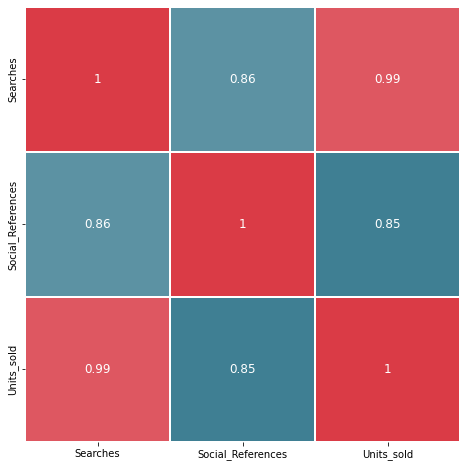

In [131]:
# plotting correlation matrix
fig, ax = plt.subplots(figsize=(8, 8))
sns.heatmap(
        dfn.corr(), 
        cmap = sns.diverging_palette(220, 10, as_cmap = True),
        square=True, 
        cbar=False,
        ax=ax,
        annot=True, 
        linewidths=0.1,vmax=1.0, linecolor='white',
        annot_kws={'fontsize':12 })
plt.show()

## Feature Importance

### Categorical Data: ANOVA test
We can use a one way ANOVA test where the relationship between categorical predictor and continuous response (Unit sold) are exaimed and when our categorical columns have a lot of distinctive groups (>100 different product types for example). ANOVA can be used for categorical feature selection for regression problems.

The assumption of the ANOVA test is that the data is normally distributed. So I'm applying data transformation to tweak the data. Common data transformation for skewed distribution includes log transform.

In the solution, I'm using sklearn's `f_classif` to compute the statistical test with ANOVA while using `SelectKBest`

#### Data Processing for ANOVA
- Label Encoding for categorical features
- data transformation for skewed data 
- Filter out NA values for date_diff

In [37]:
cat_cols

['MATERIAL_CONTENT_CODE',
 'PRODUCT_TYPES',
 'NRF_COLOR_CODE',
 'BUSINESS_SEGMENTS',
 'MODEL',
 'Sustainablity',
 'MARKETING_CATEGORY']

In [395]:
dfx = df

In [39]:
labelencoder = LabelEncoder()
for feat in cat_cols:
    dfx[feat] = labelencoder.fit_transform(dfx[feat].astype(str))

In [40]:
dfx['Units_sold_log'] = np.log10(dfx['Units_sold'])

In [41]:
X_cat = dfx[cat_cols]

In [42]:
X_cat

,MATERIAL_CONTENT_CODE,PRODUCT_TYPES,NRF_COLOR_CODE,BUSINESS_SEGMENTS,MODEL,Sustainablity,MARKETING_CATEGORY
0,366,110,0,69,5870,2,2981
1,41,0,0,9,311,2,192
2,359,105,255,5,12176,0,4584
3,381,121,82,6,6863,8,3146
4,381,35,0,53,2293,5,1715
...,...,...,...,...,...,...,...
60666,361,35,207,35,1578,0,1298
60667,53,0,0,52,11128,3,4137
60668,35,0,40,9,5504,0,2842
60669,108,44,0,17,4648,8,2678


In [43]:
y = dfx['Units_sold_log']

In [396]:
y = dfx['Units_sold']

In [189]:
# fig = go.Figure(data=[go.Histogram(x=y, nbinsx = 20)])
# fig.show()

In [397]:
from sklearn.feature_selection import SelectKBest, f_classif
fvalue_selector = SelectKBest(f_classif, k=7)
fvalue_selector.fit(X_cat, y)
X_kbest = fvalue_selector.fit_transform(X_cat, y)

In [398]:
df_scores = pd.DataFrame(fvalue_selector.scores_)
df_columns = pd.DataFrame(X_cat.columns)
feature_scores = pd.concat([df_columns, df_scores],axis=1)
feature_scores.columns = ['Feature_Name','Score']  # name output columns

In [399]:
feature_scores.sort_values(by = "Score", ascending = False)

,Feature_Name,Score
0,MATERIAL_CONTENT_CODE,1.158072
6,MARKETING_CATEGORY,1.141249
2,NRF_COLOR_CODE,1.110371
4,MODEL,1.087995
3,BUSINESS_SEGMENTS,0.981733
1,PRODUCT_TYPES,0.959666
5,Sustainablity,0.888834


## 4. Data Transformation & Preparation

### Features & Transformation Method
| Feature Name | Types | Pre-processing |
| --- | --- | --- |
| MATERIAL_CONTENT_CODE | categorical | Mean encoding |
| PRODUCT_TYPES | categorical | Mean encoding |
| BUSINESS_SEGMENT | categorical | Mean encoding |
| MODEL | categorical | Mean encoding |
| Sustainablity | categorical | One-hot encoding |
| MARKETING_CATEGORY | categorical | log transform plus center and scale |
| Searches | numerical | log transform plus center and scale|
| Social_References | numerical |log transform plus center and scale |

### 4-2. Categorical Transformation
Why not one-hot encoding
High cardinality + By one-hot encoding a categorical variable, we are inducing sparsity into the dataset.
From the splitting algorithm’s point of view, all the dummy variables are independent. If the tree decides to make a split on one of the dummy variables, the gain in purity per split is very marginal. As a result, the tree is very unlikely to select one of the dummy variables closer to the root.

#### Method1: Frequency Encoding

In [317]:
df[cat_cols] = df[cat_cols].astype(str)

In [318]:
df1 = df.copy()

In [319]:
# set up the encoder
encoder = CountFrequencyEncoder(encoding_method='frequency',
                         variables=cat_cols)
# fit the encoder
encoder.fit(df1[cat_cols])

# transform the data
df1[cat_cols]= encoder.transform(df1[cat_cols])

In [320]:
df1.head()

,Article,MATERIAL_CONTENT_CODE,PRODUCT_TYPES,BUSINESS_SEGMENTS,NRF_COLOR_CODE,MODEL,Sustainablity,MARKETING_CATEGORY,Searches,Social_References,Units_sold
0,A1,0.008505,0.024954,0.010812,0.348849,0.000115,0.097608,0.000363,193,97,84
1,B2,0.211979,0.387170,0.094922,0.348849,0.000115,0.097608,0.000082,70,53,36
2,C3,0.003082,0.058825,0.047733,0.013961,0.000115,0.099932,0.001286,211,53,120
3,D4,0.110679,0.006939,0.021262,0.042376,0.000016,0.099735,0.000494,45,23,24
4,E5,0.110679,0.010170,0.005538,0.348849,0.000709,0.101070,0.000989,183,137,96


#### Method2 : Mean encoding (Target Encoding) with smoothing
The basic idea is to replace the categorical variable with the mean of its corresponding target variable while including the average value of the all products in order to smooth the locale average.
The value of a category in a column will be calculated as:

$$\mu = \frac{n*\bar x  + m* w}{n+m}$$
while n is the number of a given category in a selected categorical feature , xbar is the mean of the unit_sold of that category, m is the overall average of the unit_sold in the dataframe, and w is the smoothing factor

In [52]:
def encode_target_smooth(data, target, categ_variables, smooth):
    """    
    Apply target encoding with smoothing.

    Parameters
    ----------
    data: pd.DataFrame
    target: str, dependent variable
    categ_variables: list of str, variables to encode
    smooth: int, number of observations to weigh global average with
    
    Returns
    --------
    encoded_dataset: pd.DataFrame
    code_map: dict, mapping to be used on validation/test datasets 
    defaul_map: dict, mapping to replace previously unseen values with
    """
    train_target = data.copy()
    code_map = dict()    # stores mapping between original and encoded values
    default_map = dict() # stores global average of each variable
    
    for v in categ_variables:
        prior = data[target].mean()
        n = data.groupby(v).size()
        mu = data.groupby(v)[target].mean()
        mu_smoothed = (n * mu + smooth * prior) / (n + smooth)
        
        train_target.loc[:, v] = train_target[v].map(mu_smoothed)        
        code_map[v] = mu_smoothed
        default_map[v] = prior        
    return train_target, code_map, default_map

In [53]:
df2, target_map, default_map = encode_target_smooth(df, 'Units_sold', cat_cols, 1000)



In [54]:
df2.head()

,Article,MATERIAL_CONTENT_CODE,PRODUCT_TYPES,BUSINESS_SEGMENTS,NRF_COLOR_CODE,MODEL,Sustainablity,MARKETING_CATEGORY,Searches,Social_References,Units_sold,Units_sold_log
0,A1,79.184926,79.101172,80.128229,79.352508,80.159233,82.305742,79.628520,193,97,84,1.924279
1,B2,79.763678,79.819206,79.615971,79.352508,79.861318,82.305742,79.769500,70,53,36,1.556303
2,C3,81.044943,78.268406,80.056557,80.073821,79.801735,78.600078,79.644107,211,53,120,2.079181
3,D4,79.896351,79.597711,78.936396,80.967893,79.692655,78.631733,79.569270,45,23,24,1.380211
4,E5,79.896351,79.122046,78.419422,79.352508,79.152778,79.503694,79.230517,183,137,96,1.982271



#### Method 3: CatBoost Encoding

https://towardsdatascience.com/how-catboost-encodes-categorical-variables-3866fb2ae640

In [321]:
#import category_encoders as ce
cbe_encoder = ce.cat_boost.CatBoostEncoder()

In [322]:
df3 = df.drop(['Article'],axis = 1)
target = df['Units_sold']

In [323]:
# Fit encoder and transform the features
cbe_encoder.fit(df3, target)
df3 = cbe_encoder.transform(df3)

In [324]:
df3.head()

,MATERIAL_CONTENT_CODE,PRODUCT_TYPES,BUSINESS_SEGMENTS,NRF_COLOR_CODE,MODEL,Sustainablity,MARKETING_CATEGORY,Searches,Social_References,Units_sold
0,78.096225,78.674421,80.705857,79.333825,131.468543,82.737084,74.423841,193,97,84
1,79.764869,79.822219,79.593012,79.333825,93.968543,82.737084,83.291391,70,53,36
2,87.934832,77.854271,80.162840,80.457250,86.468543,78.410908,78.325928,211,53,120
3,79.918366,79.241110,78.308093,81.441582,79.748348,78.447414,73.798334,45,23,24
4,79.918366,78.109625,74.479965,79.333825,65.630644,79.463843,70.749973,183,137,96


In [327]:
#articles = pd.Series(df['Article'])
df3 = pd.concat([df3, df['Article'] ], axis=1)

In [ ]:
# Fit encoder and transform the features
# cbe_encoder.fit(train, target)
# train_cbe = cbe_encoder.transform(train)
# category_encoders.cat_boost.CatBoostEncoder(verbose=0, 
# cols=None, drop_invariant=False, return_df=True, 
# handle_unknown='value', handle_missing='value', 
# random_state=None, sigma=None, a=1)

#### Method 4: Reducing Cardinality by using a threshold
Choose a threshold
Sort unique values in the column by their frequency in descending order
Keep adding the frequency of these sorted (descending) unique values until a threshold is reached.
These are the unique categories we will keep and instances of all other categories shall be replaced by “other”.

#### Other Methods:
1. Clustering
2. Feature Hashing



In [250]:
# from sklearn.feature_extraction import FeatureHasher
# df_hash=df.copy()
# for c in cat_cols:
#     df_hash[c]=df_hash[c].astype('str')      
# hashing=FeatureHasher(input_type='string')
# train=hashing.transform(df_hash[cat_cols].values)

### 4-1. Numerical Transformation

In [62]:
from sklearn.preprocessing import FunctionTransformer

In [ ]:
from sklearn.preprocessing import FunctionTransformer
transformer = FunctionTransformer(np.log1p, validate=True)
df[num_cols] = transformer.fit_transform(df[num_cols])

scaler = MinMaxScaler()
df[num_cols] = scaler.fit_transform(df[num_cols])

In [ ]:
df[num_cols].head()

# 5. Feature Importance with Linear Regression

- Avoid Overfitting: Less redundant data gives performance boost to the model and results in less opportunity to make decisions based on noise

Coefficients must be scaled to the same unit of measure to retrieve feature importance, or comparing them.




#### Regression: fit a linear model and check coefficient and p value
lm model inspection: https://inria.github.io/scikit-learn-mooc/python_scripts/dev_features_importance.html

In [125]:
#Using the mean-encoded 
X = df2.drop(['Article', 'Units_sold', 'Units_sold_log'],axis = 1)
y = df2['Units_sold']

In [128]:
scaler = MinMaxScaler()
X[num_cols+cat_cols] = scaler.fit_transform(X[num_cols+cat_cols])

In [129]:
X

,MATERIAL_CONTENT_CODE,PRODUCT_TYPES,BUSINESS_SEGMENTS,NRF_COLOR_CODE,MODEL,Sustainablity,MARKETING_CATEGORY,Searches,Social_References
0,0.403086,0.273915,0.457715,0.260155,0.250186,1.000000,0.213392,0.022841,0.041503
1,0.488039,0.408731,0.373211,0.260155,0.194560,1.000000,0.238303,0.006695,0.022280
2,0.676111,0.117558,0.445892,0.387538,0.183434,0.169500,0.216146,0.025203,0.022280
3,0.507513,0.367144,0.261104,0.545430,0.163067,0.176595,0.202922,0.003413,0.009174
4,0.507513,0.277834,0.175822,0.260155,0.062261,0.372015,0.143064,0.021528,0.058978
...,...,...,...,...,...,...,...,...,...
60666,0.364825,0.277834,0.115997,0.931959,0.350762,0.169500,0.441337,0.358231,0.119266
60667,0.443407,0.408731,0.513054,0.260155,0.178736,0.564192,0.217360,0.021003,0.014854
60668,0.590163,0.408731,0.373211,0.318163,0.178736,0.169500,0.232203,0.028091,0.019659
60669,0.488070,0.385872,0.670113,0.260155,0.216800,0.176595,0.255183,0.052901,0.054609


In [130]:
#X = df2[cat_cols+num_cols] 
#y = df2['Units_sold']
## fit a OLS model with intercept on TV and Radio
X = sm.add_constant(X) #adds an intercept 
est = sm.OLS(y, X).fit()
est.summary()

/usr/local/lib/python3.9/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning:

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only



<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             Units_sold   R-squared:                       0.977
Model:                            OLS   Adj. R-squared:                  0.977
Method:                 Least Squares   F-statistic:                 2.811e+05
Date:                Sat, 20 Nov 2021   Prob (F-statistic):               0.00
Time:                        18:38:14   Log-Likelihood:            -2.5221e+05
No. Observations:               60671   AIC:                         5.044e+05
Df Residuals:                   60661   BIC:                         5.045e+05
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     7.1094      0.389     18.290      0.000       6.348       7.871
MATERIAL_CONTENT_CODE     0.3298      0.507      0.651      0.515      -0.663       1.323
PRODUCT_TYPES             0.1205      0.323      0.373      0.709      -0.512       0.753
BUSINESS_SEGMENTS         1.1273      0.333      3.387      0.001       0.475       1.780
NRF_COLOR_CODE            0.2636      0.413      0.639      0.523      -0.545       1.073
MODEL                    11.3231      1.026     11.039      0.000       9.313      13.333
Sustainablity            -0.1013      0.230     -0.440      0.660      -0.553       0.350
MARKETING_CATEGORY        4.5574      0.685      6.651      0.000       3.214       5.900
Searches               3766.0157      4.764    790.584      0.000    3756.679    3775.352
Social_References       -38.2276      5.736     -6.664      0.000     -49.470     -26.985
==============================================================================
Omnibus:                    86146.156   Durbin-Watson:                   2.001
Prob(Omnibus):                  0.000   Jarque-Bera (JB):        585376837.630
Skew:                           7.301   Prob(JB):                         0.00
Kurtosis:                     483.986   Cond. No.                         158.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [178]:
#Retrain the model with only the training set
selected_features = ['Searches', 'Social_References', 'MARKETING_CATEGORY']
X = df2[selected_features+['Article' ]]
scaler = MinMaxScaler()
X[selected_features] = scaler.fit_transform(X[selected_features])

In [181]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 43)

In [187]:
lm = LinearRegression()
lm.fit(X_train[selected_features], y_train)
yhat = lm.predict(X_test[selected_features])

In [189]:
cdf = pd.DataFrame(lm.coef_, index=selected_features, columns=['coefficients'])
cdf

,coefficients
Searches,3796.505946
Social_References,-65.191250
MARKETING_CATEGORY,4.246737


In [ ]:
# Retain the model with the relevant features
yhat = lm.predict(X_test[selected_features])

In [116]:
#from sklearn.preprocessing import StandardScaler


In [299]:
result = pd.concat([X_test, y_test], axis=1).reset_index()

In [300]:
result

,index,Searches,Social_References,MARKETING_CATEGORY,Article,Units_sold
0,9328,0.008007,0.009611,0.226556,V9330,36
1,8153,0.002757,0.004369,0.212414,Q8155,24
2,28020,0.029404,0.009611,0.195246,T28022,108
3,28861,0.024153,0.017038,0.253825,C28863,120
4,18261,0.015883,0.011359,0.250231,K18263,60
...,...,...,...,...,...,...
12130,57553,0.004201,0.003495,0.164805,Q57555,24
12131,13481,0.000788,0.000437,0.229717,O13483,12
12132,60102,0.021922,0.023591,0.416194,S60105,84
12133,41525,0.023760,0.016601,0.299501,E41527,120


In [301]:
ys = pd.Series(yhat)
result = pd.concat([result, ys], axis=1)

In [279]:
result = df_new.sort_values(by = "Units_sold")

In [302]:
result.columns =  ['index','Searches', 'Social_References', 'MARKETING_CATEGORY', 
                  'Article', 'Units_sold', 'Predict']

In [304]:
result2 =result.sample(150)

In [307]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=result2['Article'], y=result2['Units_sold'],
                    mode='lines',
                    name='Actual'))
fig.add_trace(go.Scatter(x=result2['Article'], y=result2['Predict'],
                    mode='lines',
                    name='Predict'))

## Error Metrics

In [193]:
print(metrics.mean_absolute_error(y_test, yhat))
print(np.sqrt(metrics.mean_squared_error(y_test, yhat)))

8.473749933636826
15.810603124326141


## Feature Engineering Optimization


In [328]:
#Retrain the model with different encoding scheme and check the model performance

selected_features = ['Searches', 'Social_References', 'MARKETING_CATEGORY']
X = df3[selected_features+['Article']]
scaler = MinMaxScaler()
X[selected_features] = scaler.fit_transform(X[selected_features])

In [329]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 43)

In [330]:
lm = LinearRegression()
lm.fit(X_train[selected_features], y_train)
yhat = lm.predict(X_test[selected_features])

In [331]:
cdf = pd.DataFrame(lm.coef_, index=selected_features, columns=['coefficients'])
cdf

,coefficients
Searches,3784.423177
Social_References,-64.149110
MARKETING_CATEGORY,60.054054


In [332]:
print(metrics.mean_absolute_error(y_test, yhat))
print(np.sqrt(metrics.mean_squared_error(y_test, yhat)))

8.49992850505021
15.85131623687633


In [345]:
selected_features = ['Searches', 'Social_References', 'MARKETING_CATEGORY', 'MODEL']
X = df3[selected_features+['Article']]
scaler = MinMaxScaler()
X[selected_features] = scaler.fit_transform(X[selected_features])

In [346]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 43)

In [347]:
lm = LinearRegression()
lm.fit(X_train[selected_features], y_train)
yhat = lm.predict(X_test[selected_features])

In [348]:
cdf = pd.DataFrame(lm.coef_, index=selected_features, columns=['coefficients'])
cdf

,coefficients
Searches,3769.403612
Social_References,-67.198469
MARKETING_CATEGORY,57.817189
MODEL,34.358545


In [349]:
print(metrics.mean_absolute_error(y_test, yhat))
print(np.sqrt(metrics.mean_squared_error(y_test, yhat)))

8.495911921790052
15.894249374604888


# 6. MVP

## MVP
- Using the avergae unit sales of maetrical content code as sales prediction

In [357]:
df

,Article,MATERIAL_CONTENT_CODE,PRODUCT_TYPES,BUSINESS_SEGMENTS,NRF_COLOR_CODE,MODEL,Sustainablity,MARKETING_CATEGORY,Searches,Social_References,Units_sold
0,A1,TRFU,44.0,97528.0,1.0,GKD49,Organic materials,GK6,193,97,84
1,B2,AT2E,1.0,3030975.0,1.0,21972,Organic materials,2115,70,53,36
2,C3,TREU,39.0,303034.0,997.0,KYH28,Low carbon footprint,KY25,211,53,120
3,D4,TRK4,51.0,30305.0,400.0,GUP97,Reegrow,GU16,45,23,24
4,E5,TRK4,19.0,886.0,1.0,DBI07,Recycleable,DB7,183,137,96
...,...,...,...,...,...,...,...,...,...,...,...
60666,M60671,TRFP,19.0,342975.0,690.0,BH562,Low carbon footprint,BH15,2748,275,1212
60667,N60672,AT2R,1.0,885.0,1.0,JII14,PFC free,JI11,179,36,108
60668,O60673,AT28,1.0,3030975.0,301.0,GEO43,Low carbon footprint,GE10,233,47,108
60669,P60674,AT5A,201.0,307975.0,1.0,FVF67,Reegrow,FV2,422,127,228


In [363]:
mvp_X = df
mvp_y = df['Units_sold']

In [364]:
X_train, X_test, y_train, y_test = train_test_split(mvp_X, mvp_y, test_size = 0.2, random_state = 43)

In [366]:
smooth = 100
prior = X_test['Units_sold'].mean()
n = X_test.groupby('MATERIAL_CONTENT_CODE').size()
mu = X_test.groupby('MATERIAL_CONTENT_CODE')['Units_sold'].mean()
mu_smoothed = (n * mu + smooth * prior) / (n + smooth)

In [376]:
result_mvp = pd.DataFrame(mu_smoothed).reset_index()

In [378]:
result_mvp.columns = ["MATERIAL_CONTENT_CODE", "Prediction"]

In [380]:
mvp_df =pd.merge(X_test, result_mvp, how="left", on=["MATERIAL_CONTENT_CODE"])

In [381]:
mvp_df

,Article,MATERIAL_CONTENT_CODE,PRODUCT_TYPES,BUSINESS_SEGMENTS,NRF_COLOR_CODE,MODEL,Sustainablity,MARKETING_CATEGORY,Searches,Social_References,Units_sold,Prediction
0,V9330,AT2E,1.0,9752975.0,100.0,26750,Reegrow,2625,80,24,36,80.218011
1,Q8155,DO01,39.0,342975.0,33.0,LLB41,PFC free,LL18,40,12,24,81.193158
2,T28022,TRK4,30.0,897534.0,35.0,IWP55,Low carbon footprint,IW8,243,24,108,82.349337
3,C28863,AT2E,1.0,30308.0,50.0,LGN00,PFC free,LG9,203,41,120,80.218011
4,K18263,M3X,66.0,30307.0,650.0,BEG36,Recycled plastic,BE17,140,28,60,78.064279
...,...,...,...,...,...,...,...,...,...,...,...,...
12130,Q57555,DO07,39.0,3078.0,1.0,FBC47,Recycled,FB12,51,10,24,78.504151
12131,O13483,AT2E,1.0,97522.0,1.0,20758,Organic materials,203,25,3,12,80.218011
12132,S60105,PRMU,267.0,8342.0,150.0,KXN36,PFC free,KX1,186,56,84,81.704894
12133,E41527,TRKA,16.0,9758975.0,683.0,LGF21,Not Applicable,LG21,200,40,120,81.907743


In [382]:
print(metrics.mean_absolute_error(mvp_df["Units_sold"], mvp_df["Prediction"]))
print(np.sqrt(metrics.mean_squared_error(mvp_df["Units_sold"], mvp_df["Prediction"])))

40.04964040326495
105.40342587026628


In [352]:
# from sklearn.metrics import mean_absolute_error
# from matplotlib import pyplot

## Linear Model
https://inria.github.io/scikit-learn-mooc/python_scripts/dev_features_importance.html

https://www.ritchieng.com/machine-learning-evaluate-linear-regression-model/

# 7. Random Forest Models
- non-linear trend in the data

In [388]:
from sklearn.ensemble import RandomForestRegressor

In [447]:
selected_features = ['Searches', 'Social_References', 'MARKETING_CATEGORY', 'MODEL']
X2 = df2[selected_features]
y2 = df2['Units_sold']
scaler = MinMaxScaler()
X[selected_features] = scaler.fit_transform(X[selected_features])

In [456]:
X2 = df2.drop(['Article', 'Units_sold', 'Units_sold_log'],axis = 1)
y2 = df2['Units_sold']

In [458]:

scaler = MinMaxScaler()
X2 = scaler.fit_transform(X2)

In [459]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X2, y2, test_size=0.3, random_state = 42)

In [460]:
# Set up and run the model
RFRegressor = RandomForestRegressor(n_estimators=50, 
                                    min_samples_split=5, min_samples_leaf=2, 
                                    max_features='auto', bootstrap=True, random_state=42)
RFRegressor.fit(X_train, y_train)

RandomForestRegressor(min_samples_leaf=2, min_samples_split=5, n_estimators=50,
                      random_state=42)

In [472]:
#https://mljar.com/blog/feature-importance-in-random-forest/
importances = RFRegressor.feature_importances_
feature_names = df2.drop(['Article', 'Units_sold', 'Units_sold_log'],axis = 1).columns

<BarContainer object of 9 artists>

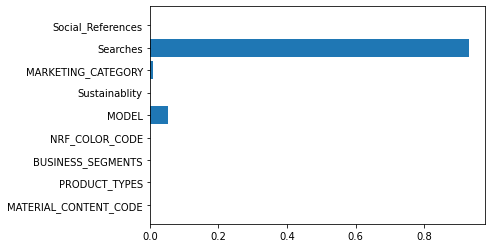

In [475]:
plt.barh(feature_names, importances)

In [476]:
ypredr = RFRegressor.predict(X_test)

In [477]:
print(metrics.mean_absolute_error(y_test, ypredr))
print(np.sqrt(metrics.mean_squared_error(y_test, ypredr)))

6.723819321944584
16.87107734165242


In [478]:
from sklearn.metrics import r2_score
r2_score(y_test, ypredr)

0.9741116448442991

In [480]:
#retrain the model with important features (removing social reference)

In [490]:
X2 = df2[['Searches', 'MARKETING_CATEGORY', 'MODEL']]
scaler = MinMaxScaler()
X2 = scaler.fit_transform(X2)
X_train, X_test, y_train, y_test = train_test_split(X2, y2, test_size=0.3, random_state = 42)

In [493]:
X_train

array([[0.02572854, 0.22169109, 0.14561299],
       [0.01299554, 0.16474462, 0.13365522],
       [0.00564453, 0.11495075, 0.16323847],
       ...,
       [0.03281701, 0.31433361, 0.19225071],
       [0.02126542, 0.2304706 , 0.1825422 ],
       [0.00420058, 0.24955683, 0.16306699]])

The parameter n_estimators creates n number of trees

In [495]:
rf = RandomForestRegressor(n_estimators=50, 
                                    min_samples_split=5, min_samples_leaf=2, 
                                    max_features='auto', bootstrap=True, random_state=42)
rf.fit(X_train, y_train)
ypredr_new = rf.predict(X_test)

In [496]:
ypredr_new

array([110.65419048,  12.        ,  24.        , ...,  68.932     ,
        73.54790476, 116.32114286])

In [497]:
print(metrics.mean_absolute_error(y_test, ypredr_new))
print(np.sqrt(metrics.mean_squared_error(y_test, ypredr_new)))

6.74055127870335
16.30965261766614



## 8. Hyperparameter Tuning

In [506]:
n_estimators = [int(x) for x in range(10,1000,50)]

In [509]:
from sklearn.model_selection import RandomizedSearchCV

# Number of trees in random forest
n_estimators = [int(x) for x in range(10,1000,50)]
# Number of features to consider at every split

#The maximum depth of the tree. 
max_depth = [int(x) for x in np.linspace(10, 110, num = 10)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf}
print(random_grid)

{'n_estimators': [10, 60, 110, 160, 210, 260, 310, 360, 410, 460, 510, 560, 610, 660, 710, 760, 810, 860, 910, 960], 'max_depth': [10, 21, 32, 43, 54, 65, 76, 87, 98, 110, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4]}


In [512]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf_new = RandomForestRegressor()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf_new, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
rf_random.fit(X_train, y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


KeyboardInterrupt: 

In [ ]:
from sklearn.model_selection import GridSearchCV
rf_new = RandomForestClassifier()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf_new, param_grid = param_grid, 
                          cv = 3, n_jobs = -1, verbose = 2)

# Fit the grid search to the data
grid_search.fit(x_train,y_train)

In [ ]:
grid_search.best_params_

In [ ]:
rf_random.best_params_

In [ ]:
best_random = rf_random.best_estimator_

In [ ]:
sub = best_random.predict(y_test)

In [425]:
from pprint import pprint
# Look at parameters used by our current forest
print('Parameters currently in use:\n')
pprint(RFRegressor.get_params())

Parameters currently in use:

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'mse',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 20,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}


In [426]:
from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
pprint(random_grid)
{'bootstrap': [True, False],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, None],
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]}

{'bootstrap': [True, False],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None],
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]}


{'bootstrap': [True, False],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, None],
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]}

In [428]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestRegressor()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
rf_random.fit(X_train, y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


KeyboardInterrupt: 

In [ ]:
rf_random.best_params_

In [ ]:
base_model = RandomForestRegressor(n_estimators = 10, random_state = 42)
base_model.fit(train_features, train_labels)
base_accuracy = evaluate(base_model, test_features, test_labels)

best_random = rf_random.best_estimator_
random_accuracy = evaluate(best_random, test_features, test_labels)


In [ ]:
ypred_best = rf.predict(X_test)

In [ ]:
print(metrics.mean_absolute_error(y_test, ypred_best))
print(np.sqrt(metrics.mean_squared_error(y_test,ypred_best)))

# 9. What could be better?

# 10. Ideads on what other information could help
Marketing category> we should have like marketing impressions or cost click/
it would be good to have more context with the marketing performance